In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import sys
import glob
import os
import peakutils
import datetime
import warnings
import logging
from jupyterthemes import jtplot

In [2]:
from xps.xps_sw import *
from xps.xps_import import *
from xps.xps_analysis import *
from xps.xps_bg import *

jtplot.style('default', grid=False)
logging.getLogger().setLevel(logging.CRITICAL)

plt.rcParams['errorbar.capsize'] = 8
plt.rcParams['font.size'] = 18
plt.rcParams['lines.linewidth'] = 2.5
plt.rc('font', size= 18)
plt.rc('legend', fontsize= 15)
plt.rc('xtick', labelsize= 18)
plt.rc('xtick.major', size=6)
plt.rc('ytick.major', size=6)

plt.rc('ytick', labelsize= 18)
plt.rc('axes', labelsize=18)
plt.rc('axes', titlesize=18)

In [3]:
asf = dict({'C_1s' : 0.296, 'O_1s' : 0.711, 'N_1s' : 0.477, 'Ba_3d' : 7.49,
            'Cu_2p' : 5.321, 'Cl_2p' : 0.891})

### Background subtraction class (dev) 

In [5]:
class Background2(object):
    @staticmethod
    def bg_handler(xp, region,  *args, **kwargs):
        x = xp.dfx[region].dropna().energy.values
        y = xp.dfx[region].dropna().counts.values
        return x, y

    @staticmethod
    def edit_xp(xp, region, x, y, ybg, ax = None):
        if ax == None: ax = plt.gca()
        col = plot_region(xp, region, lb=region, ax=ax).get_color()
        ax.plot(x, ybg, '--', color=col, label='__nolabel__')
        cosmetics_plot(ax=ax)
        
        dfnew = pd.DataFrame({'energy' : x, 'counts' : y - ybg})
        xpNew = deepcopy(xp)
        xpNew.dfx[region] = dfnew
        return xpNew

    def dec_linear(self, xp, region, *args, **kwargs):
        x, y = self.bg_handler(xp, region, *args, **kwargs)

        ybg = peakutils.baseline(y, deg=1)
        return self.edit_xp(xp, region, x, y, ybg)
    
    def dec_shirley(self, xp, region, maxit=40, **kwargs):
        kwargs['maxit'] = maxit
        x,y = self.bg_handler(xp, region, **kwargs)
        ybg = shirley_loop(x,y, **kwargs)
        return self.edit_xp(xp, region, x, y, ybg)
    
    def dec_2shirley(self, xp, region, xlim, maxit=40, **kwargs):
        x, y = self.bg_handler(xp, region, **kwargs)
        y1 = y[ x >= xlim ]
        x1 = x[ x >= xlim ]
        y2 = y[ x <= xlim ]
        x2 = x[ x <= xlim ]

        ybg1 = shirley_loop(x1, y1, maxit = maxit)#, flag_plot=flag_plot, ax = ax)
        ybg2 = shirley_loop(x2, y2, maxit = maxit)#, flag_plot=flag_plot, ax = ax)
        ybg = np.append(np.append(ybg1[:-1], np.average([ybg1[-1], ybg2[0]])), ybg2[1:] )
        return self.edit_xp(xp, region, x, y, ybg, **kwargs)

NameError: name 'trim_exps' is not defined

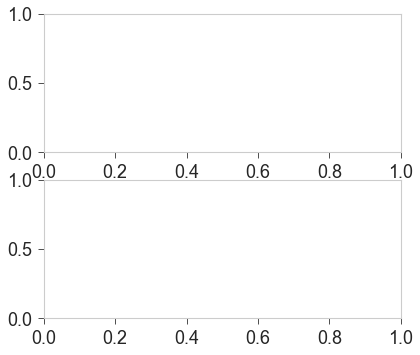

In [6]:
# Background2().dec_linear(xp=experiments[0], region='C_1s')
fig, ax = plt.subplots(2)
BG2 = Background2()
bg2 = BG2.dec_2shirley(xp=trim_exps[0], region='overview_', 
                       xlim = 346, maxit=50, ax=ax[0])
bg2 = BG2.dec_linear(xp=trim_exps[0], 
                     region='overview_', ax=ax[1])

In [ ]:
def test_bg_subpots()
    fig, ax = plt.subplots(2)
    BG2 = Background2()
    bg2 = BG2.dec_2shirley(xp=trim_exps[0], region='overview_', 
                           xlim = 346, maxit=50, ax=ax[0])
    bglin = BG2.dec_linear(xp=trim_exps[0], 
                         region='overview_', ax=ax[1])

    assert len(ax[0].get_lines()) <= 2, "Too many lines in lin_bg subplot"
    assert len(ax[0].get_lines()) >= 2, "Not enough lines in lin_bg subplot"

In [ ]:
BG2 = Background2()
bg2 = BG2.dec_2shirley(xp=trim_exps[0], region='overview_', 
                       xlim = 346, maxit=50, ax=ax[0])
x,y = BG2.bg_handler(xp=trim_exps[0], region='overview_')
x,ybg = BG2.bg_handler(bg2, region='overview_')
lentest = len(np.where(y < ybg)[0])
assert lentest == 0, "Background over signal in %i points"%lentest


In [ ]:
BG2 = Background2()
bg2 = BG2.dec_linear(xp=trim_exps[0], region='overview_')
x,y = BG2.bg_handler(xp=trim_exps[0], region='overview_')
x,ybg = BG2.bg_handler(bg2, region='overview_')
lentest = len(np.where(y < ybg)[0])
assert lentest == 0, "Background over signal in %i points"%lentest


In [ ]:
def test_method(method):
    BG2 = Background2()
    bg2 = method(xp=trim_exps[0], region='overview_')
    x,y = BG2.bg_handler(xp=trim_exps[0], region='overview_')
    x,ybg = BG2.bg_handler(bg2, region='overview_')
    lentest = len(np.where(y < ybg)[0])
    assert lentest == 0, "Background over signal in %i points"%lentest
test_method(Background2().dec_linear)

## Pre-processing of data FBI on Cu policrystal
1- Sublimations in UHV (Sept-Oct 2020)

# Import data

In [3]:
path = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/**/*.xy'
files = glob.glob(path, recursive=True)
files.sort()
files_new = []
for f in files:
    if (' ' not in f) and ('/proc' not in f) and ('BaCl2' not in f):
        files_new.append(f)
# files_new.pop(3)

files = files_new
for f in files:
    print(os.path.split(f)[1])

20200922_1-Cu_clean.xy
20200923_1-Cu_FBI_subl_20min.xy
20201013_2-Cu_FBI_subl_20min.xy
20201013_2-Cu_clean.xy
20201014_3-Cu_FBI_subl_25min.xy
20201014_3-Cu_FBI_subl_50min.xy
20201014_3-Cu_clean.xy
20201016_4-Cu_FBI_subl_5min.xy
20201016_4-Cu_clean.xy
20201016_4-Cu_clean4.xy
20201019_5-Cu_FBI_subl_11min.xy
20201019_5-Cu_FBI_subl_6min.xy
20201019_5-Cu_clean.xy
20201020_5-Cu_FBI_subl_16min.xy
20201020_5-Cu_FBI_subl_21min.xy
20201021_6-Cu_FBI_subl_15min.xy
20201021_6-Cu_clean.xy


In [11]:
find_groups(files[1])

1

In [4]:
experiments = [xps_data_import(path=f) for f in files]

for xp in experiments:
    if 'FBI' in xp.name:
        xp.name = xp.name.replace('Cu_', '').replace('_subl_', ' ')

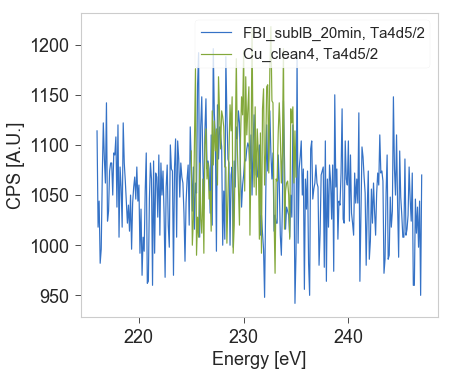

In [9]:
for xp in experiments:
    if 'Ta4d5/2' in xp.dfx.columns.levels[0]:
        plot_region(xp, 'Ta4d5/2')

## Merge clean 4 (quick, O 1s only) 

In [5]:
experiments[8].dfx['O_1s'] = experiments[9].dfx['O_1s']
experiments[8].dfx['Cu_2p'] = experiments[9].dfx['Cu_2p']


In [6]:
experiments = experiments[:9] + experiments[10:]

In [7]:
for xp in experiments:
    print(xp.name)

1-Cu_clean
1-FBI 20min
2-FBI 20min
2-Cu_clean
3-FBI 25min
3-FBI 50min
3-Cu_clean
4-FBI 5min
4-Cu_clean
5-FBI 11min
5-FBI 6min
5-Cu_clean
5-FBI 16min
5-FBI 21min
6-FBI 15min
6-Cu_clean


## Change Ba3d5/2 to Ba 3d

In [8]:
for xp in experiments:
    try:
        xp.dfx.rename_axis({'Ba3d5/2': 'Ba_3d'}, axis=1, copy=False, inplace=True)
    except KeyError:
        pass

/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Using 'rename_axis' to alter labels is deprecated. Use '.rename' instead
  This is separate from the ipykernel package so we can avoid doing imports until


# Bg subtraction

In [9]:
region = 'Cu_2p'

1-Cu_clean
1-FBI 20min
2-FBI 20min
2-Cu_clean
3-FBI 25min
3-FBI 50min
3-Cu_clean
4-FBI 5min
4-Cu_clean
5-FBI 11min
5-FBI 6min
5-Cu_clean
5-FBI 16min
5-FBI 21min
6-FBI 15min
6-Cu_clean


Text(0.5, 1.0, 'Cu 2p')

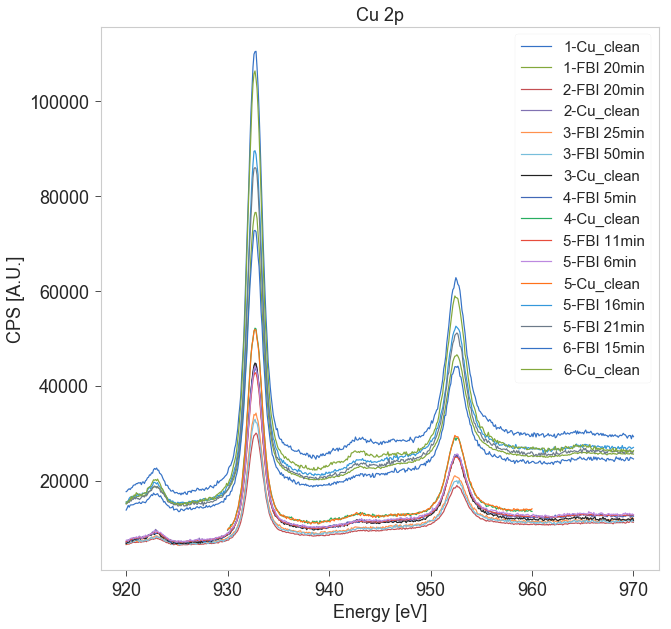

In [10]:
plt.figure(figsize=(10,10))
for xp in experiments:
    print(xp.name)
    plot_region(xp, region)
# plt.xlim(70, 100)
# plt.ylim(1.5e5, 4e5)
# cosmetics_plot()
plt.title('Cu 2p')

/Users/pabloherrero/sabat/sabatsw/xps/xps_analysis.py:64: RuntimeWarning: invalid value encountered in greater
  dropup = np.where(xp.dfx[region].energy.values > eup)[0]


Text(0.5, 1.0, 'Cu 2p')

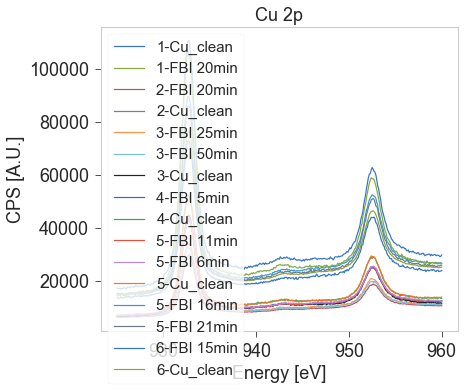

In [11]:
trim_exps = []
# for xp in experiments[:3]+experiments[4:]:
for xp in experiments:
    xp_new = crop_spectrum(xp, region=region, eup=960, edw=925)
    trim_exps.append(xp_new)
    plot_region(xp_new, region)
# cosmetics_plot()
plt.title('Cu 2p')

## Subtract double shirley to all Cu regions

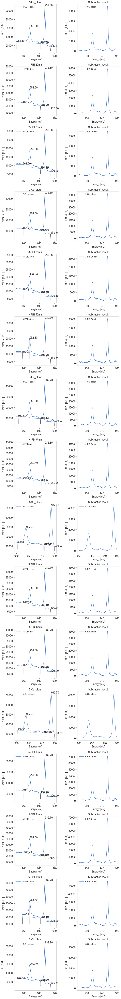

In [12]:
region = 'Cu_2p'

bg_exps = region_2bg_subtract(experiments, region=region, xlim=938)

## Bulk subtract background

Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline


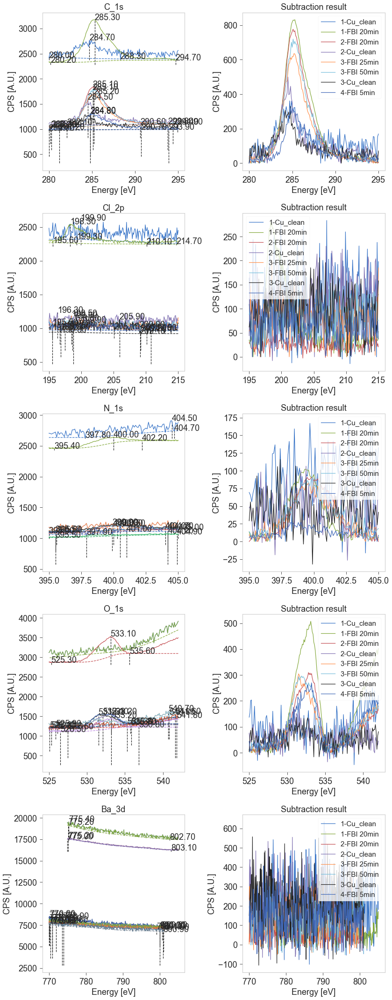

In [13]:
regions = ['C_1s', 'Cl_2p', 'N_1s', 'O_1s', 'Ba_3d']
bg_exps[:8] = bulk_bg_subtract(bg_exps[:8], regions)

Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
KeyError on  'Cl_2p'
Max iterations exceeded, subtract ALS baseline
KeyError on  'Ba_3d'
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline
Max iterations exceeded, subtract ALS baseline


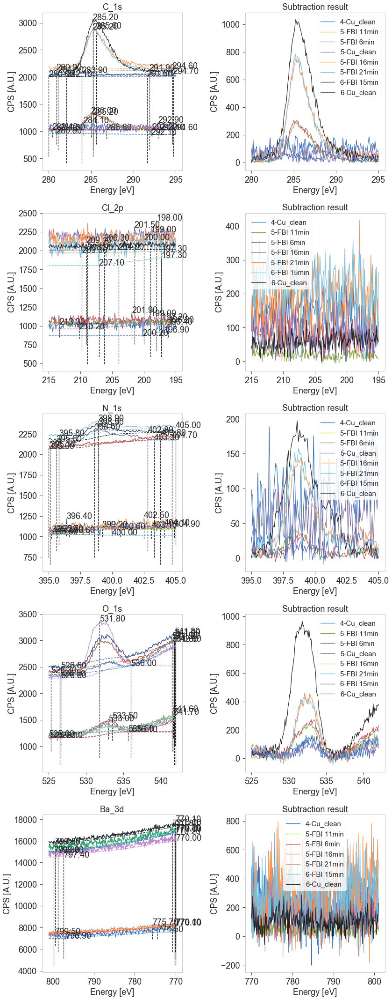

In [14]:
regions = ['C_1s', 'Cl_2p', 'N_1s', 'O_1s', 'Ba_3d']
bg_exps[8:] = bulk_bg_subtract(bg_exps[8:], regions)

#### Plot result of bulk subtract

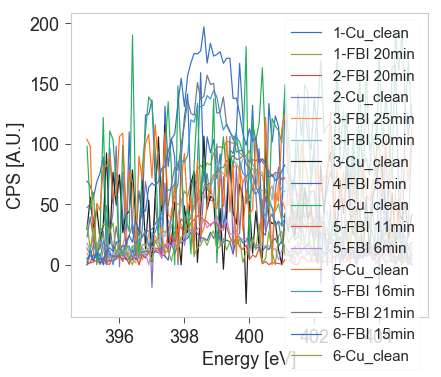

In [169]:
region = 'N_1s'
for xp in bg_exps:
    plot_region(xp, region)

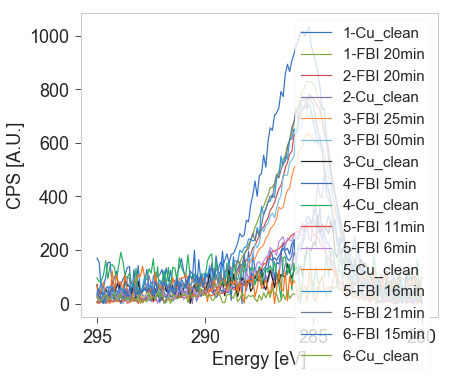

In [170]:
region = 'C_1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

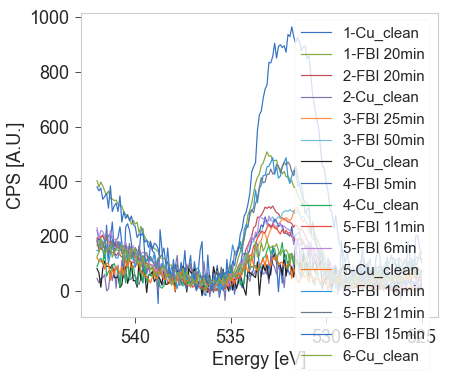

In [171]:
region = 'O_1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

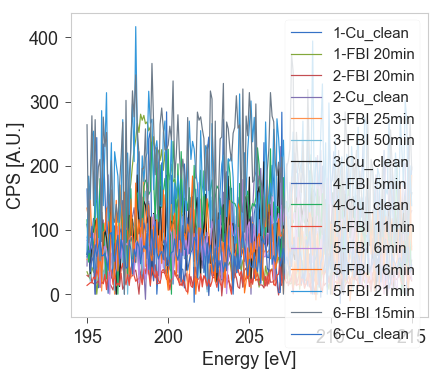

In [172]:
region = 'Cl_2p'
for xp in bg_exps:
    try:
        plot_region(xp, region)
    except KeyError:
        pass
cosmetics_plot()

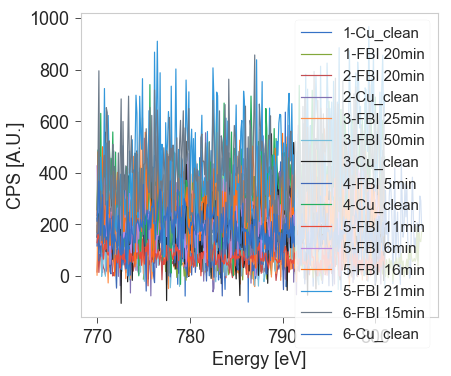

In [173]:
region = 'Ba_3d'
for xp in bg_exps:
    try:
        plot_region(xp, region)
    except KeyError:
        pass
cosmetics_plot()

## Subtract linear and shirley bg to all O 1s regions

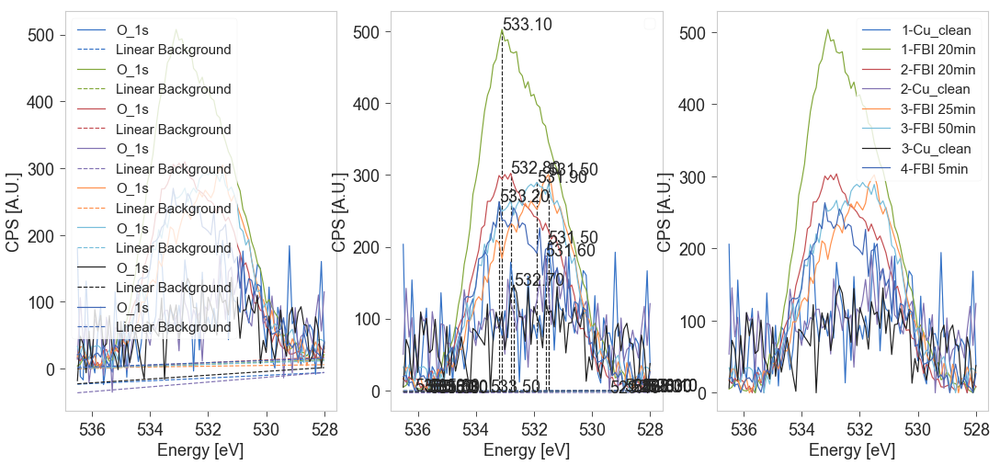

In [15]:
region = 'O_1s'
fig, ax = plt.subplots(1, 3, figsize=(18, 8))
new_exps = []
for xp in bg_exps[:8]:
    xp_crop = crop_spectrum(xp, region, eup=536.5, edw=528)
    xp_lin = subtract_linear_bg(xp_crop, region, ax=ax[0])
    xp_bg = subtract_shirley_bg(xp_lin, region, maxit=40, ax=ax[1])
    plot_region(xp_bg, region, ax=ax[2])
    new_exps.append(xp_bg)
for i in range(3): cosmetics_plot(ax=ax[i])
bg_exps[:8] = new_exps

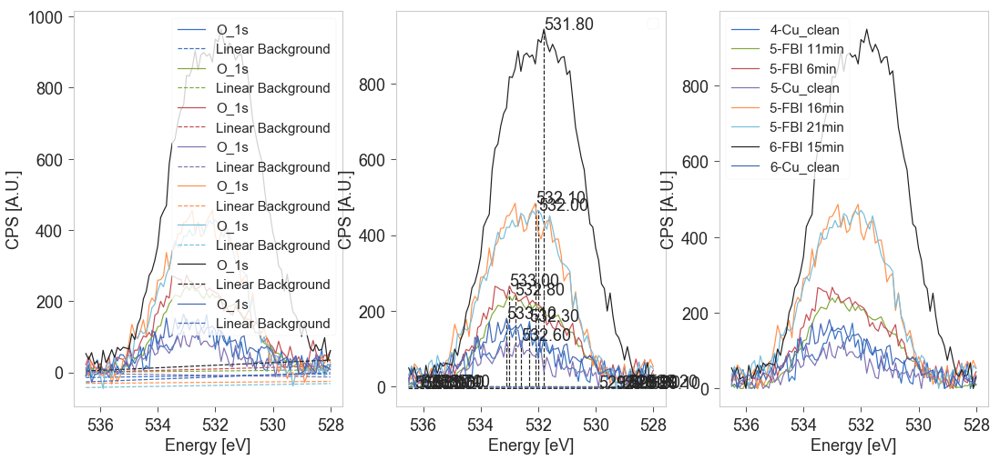

In [16]:
region = 'O_1s'
fig, ax = plt.subplots(1, 3, figsize=(18, 8))
new_exps = []
for xp in bg_exps[8:]:
    xp_crop = crop_spectrum(xp, region, eup=536.5, edw=528)
    xp_lin = subtract_linear_bg(xp_crop, region, ax=ax[0])
    xp_bg = subtract_shirley_bg(xp_lin, region, maxit=40, ax=ax[1])
    plot_region(xp_bg, region, ax=ax[2])
    new_exps.append(xp_bg)
for i in range(3): cosmetics_plot(ax=ax[i])
bg_exps[8:] = new_exps

## Subtract linear and shirley bg to all N 1s regions

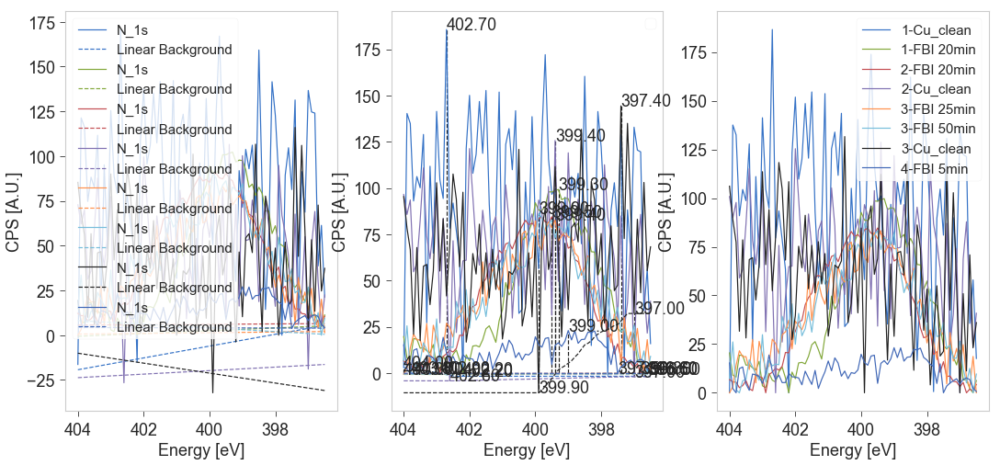

In [17]:
region = 'N_1s'
fig, ax = plt.subplots(1, 3, figsize=(18, 8))
new_exps = []
for xp in bg_exps[:8]:
    xp_crop = crop_spectrum(xp, region, eup=404, edw=396.5)
    xp_lin = subtract_linear_bg(xp_crop, region, ax=ax[0])
    xp_bg = subtract_shirley_bg(xp_lin, region, maxit=40, ax=ax[1])
    plot_region(xp_bg, region, ax=ax[2])
    new_exps.append(xp_bg)
for i in range(3): cosmetics_plot(ax=ax[i])
bg_exps[:8] = new_exps

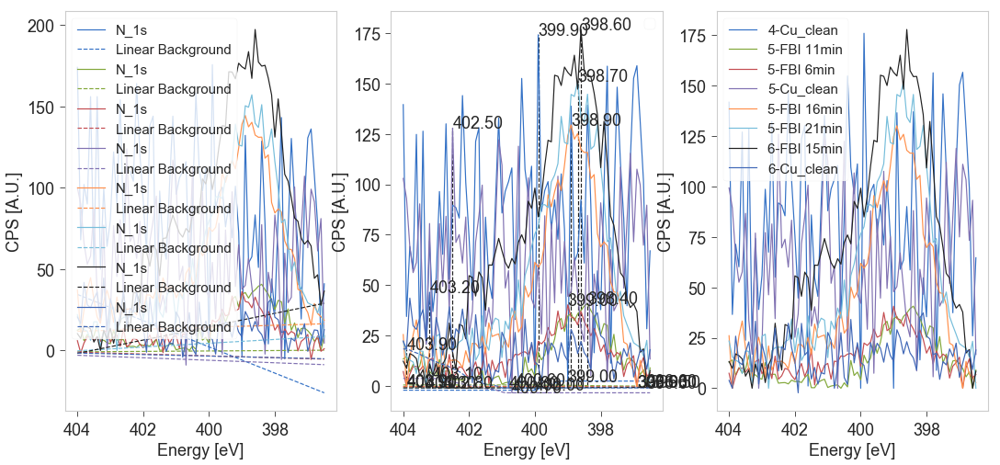

In [18]:
region = 'N_1s'
fig, ax = plt.subplots(1, 3, figsize=(18, 8))
new_exps = []
for xp in bg_exps[8:]:
    xp_crop = crop_spectrum(xp, region, eup=404, edw=396.5)
    xp_lin = subtract_linear_bg(xp_crop, region, ax=ax[0])
    xp_bg = subtract_shirley_bg(xp_lin, region, maxit=40, ax=ax[1])
    plot_region(xp_bg, region, ax=ax[2])
    new_exps.append(xp_bg)
for i in range(3): cosmetics_plot(ax=ax[i])
bg_exps[8:] = new_exps

## Compress noisy regions

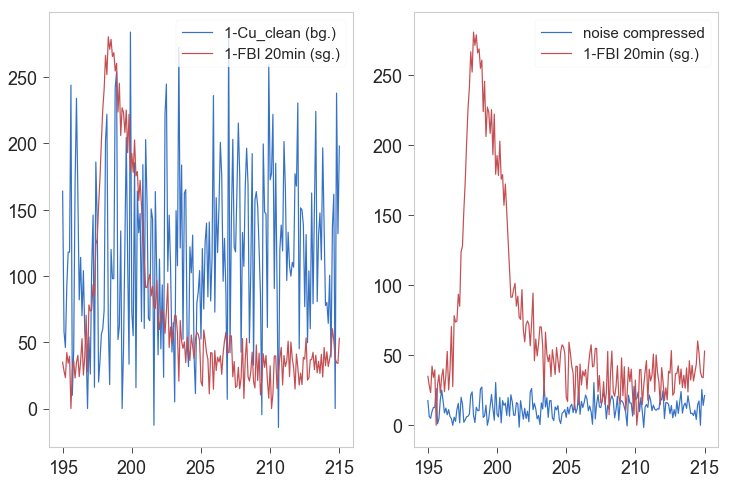

In [19]:
region= 'Cl_2p'
compress_noisy_region(bg_exps[0], bg_exps[1], region, inplace=True);

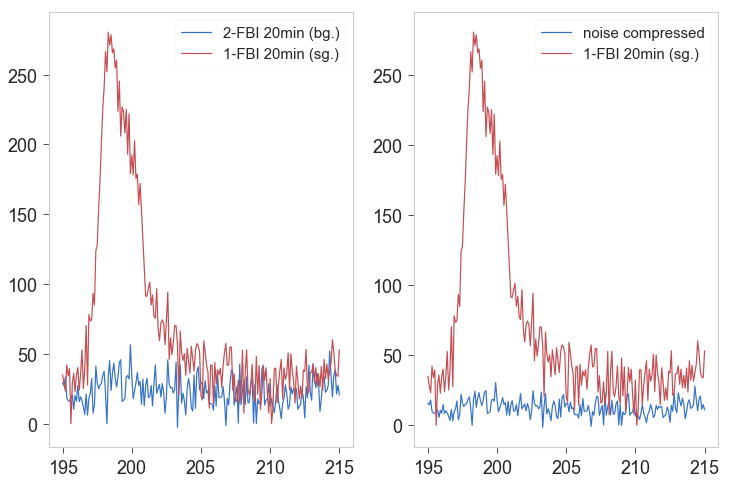

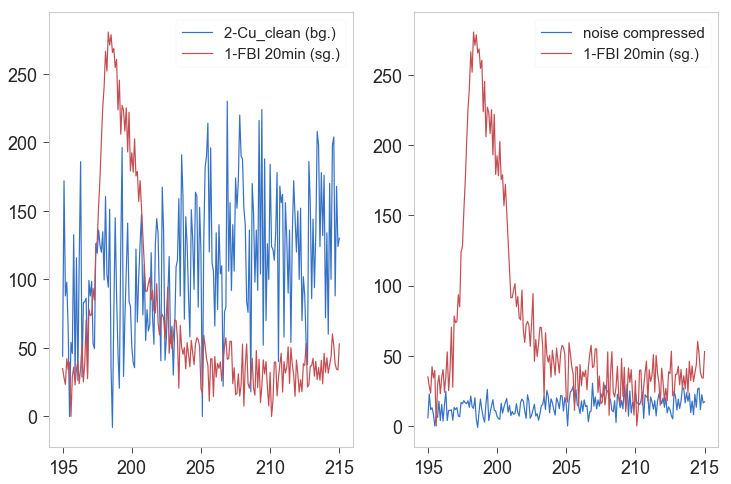

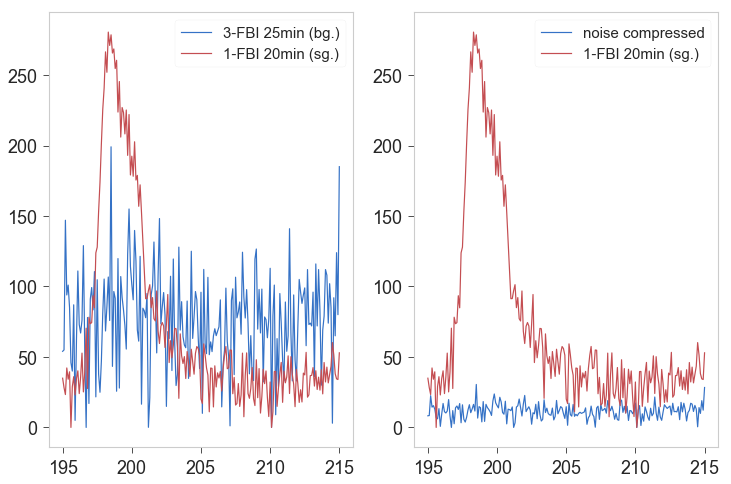

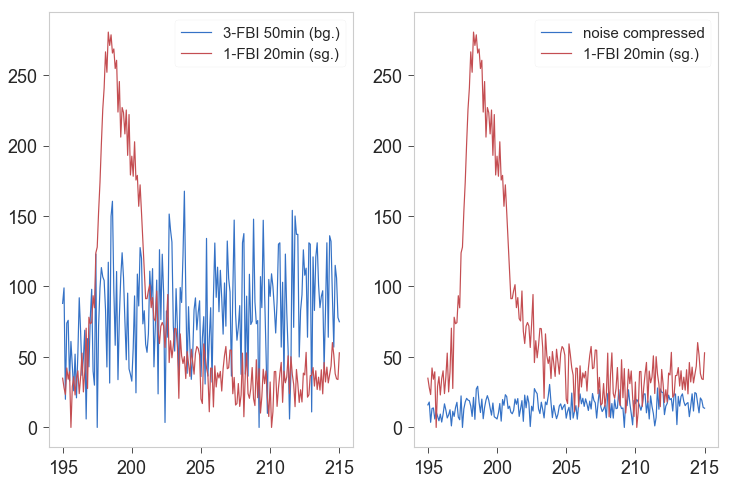

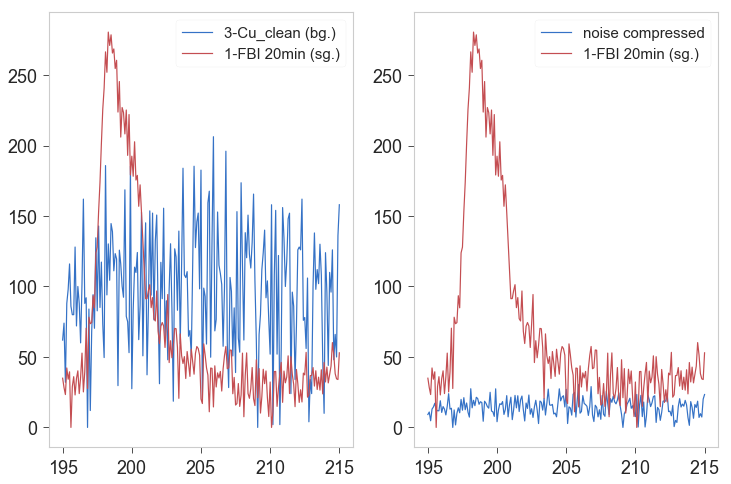

...

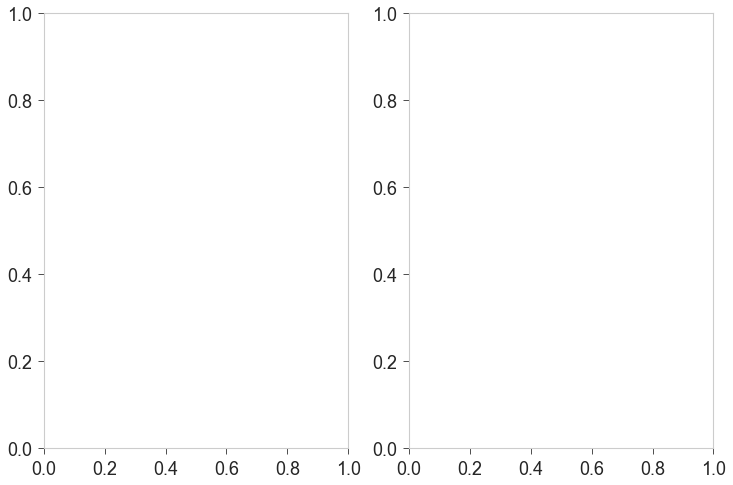

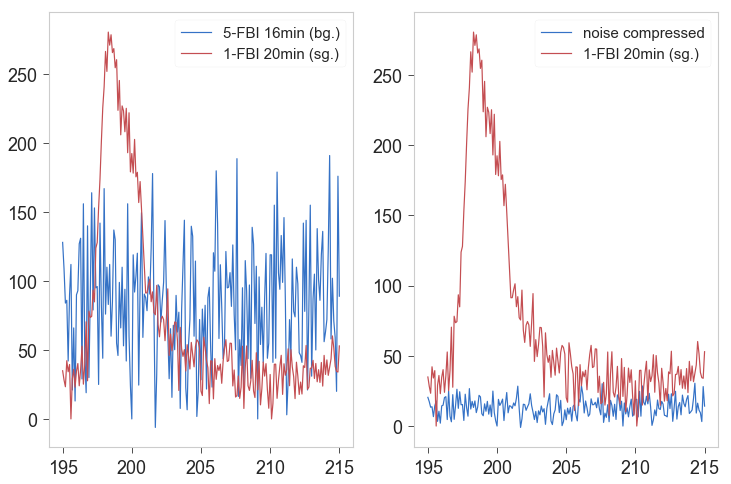

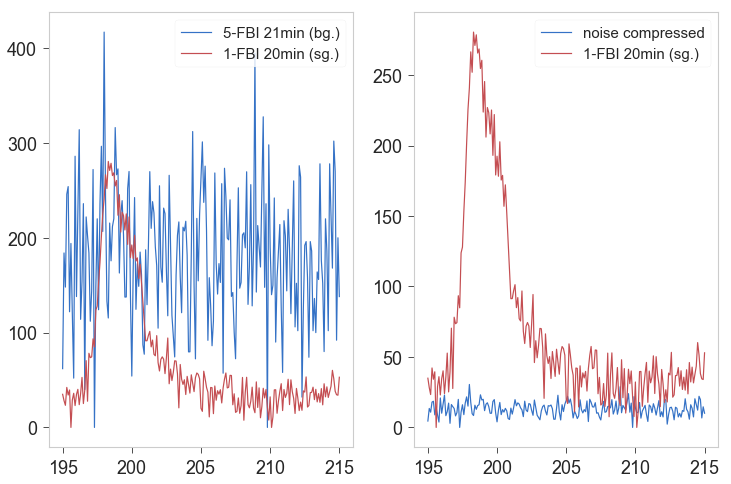

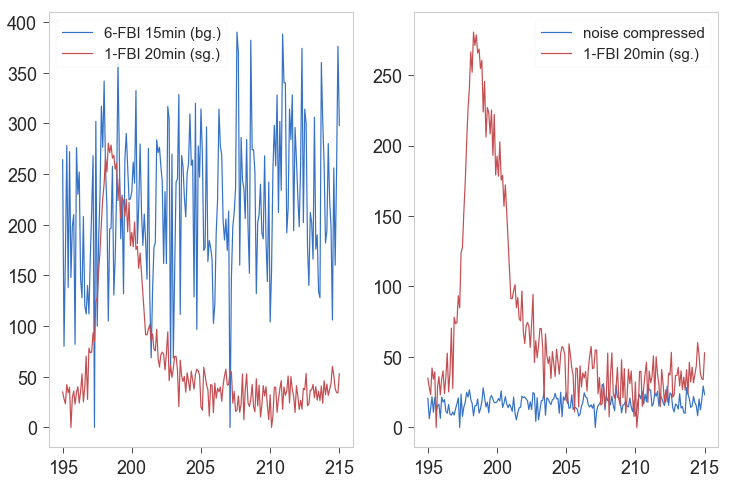

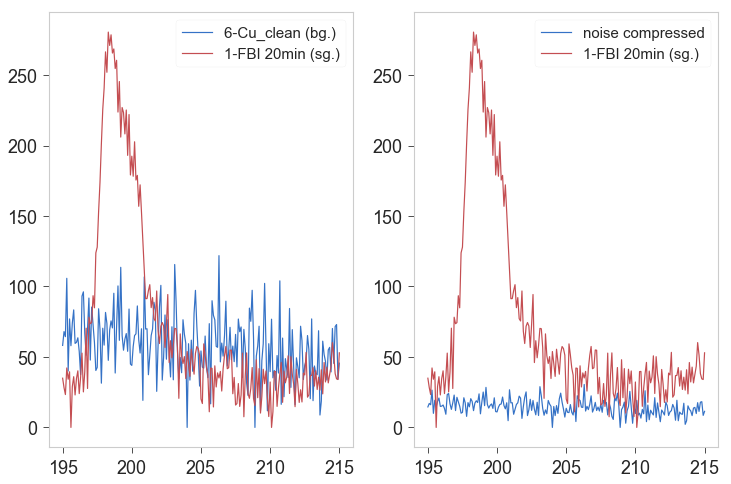

In [20]:
region= 'Cl_2p'
for xp in bg_exps[2:]:
    try:
        compress_noisy_region(xp, bg_exps[1], region, inplace=True);
    except KeyError:
        pass

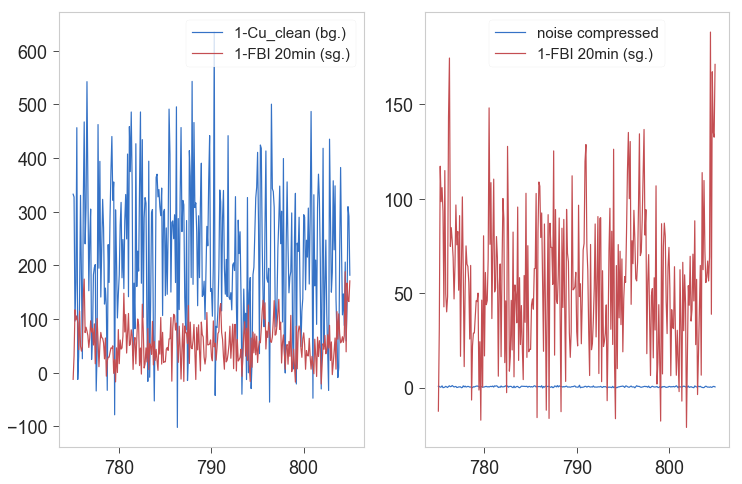

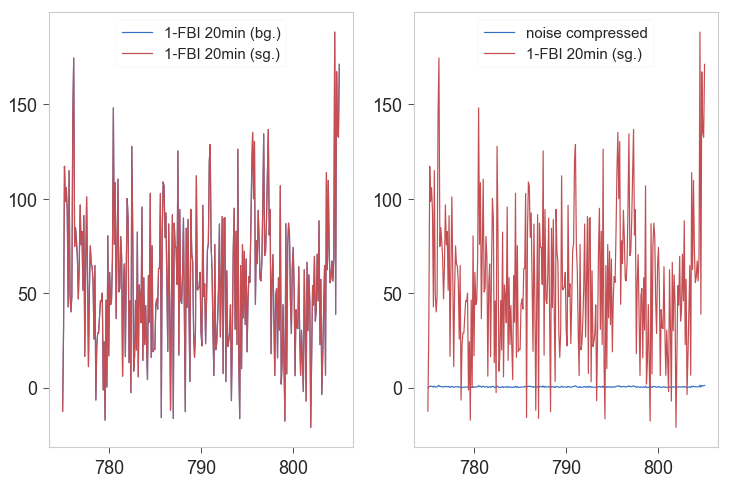

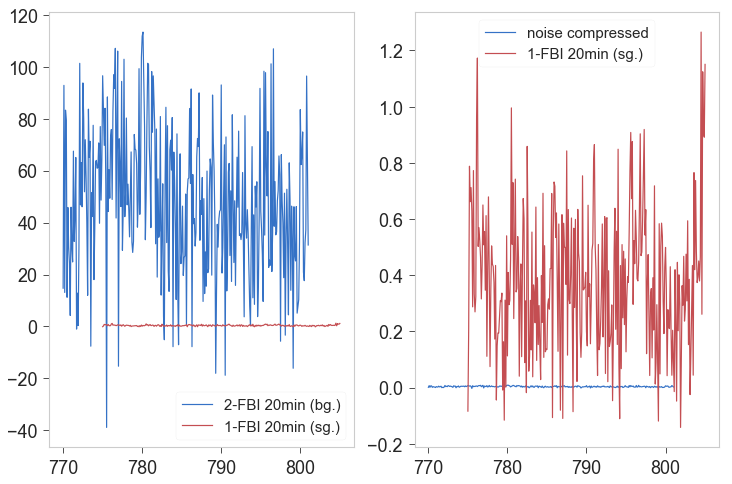

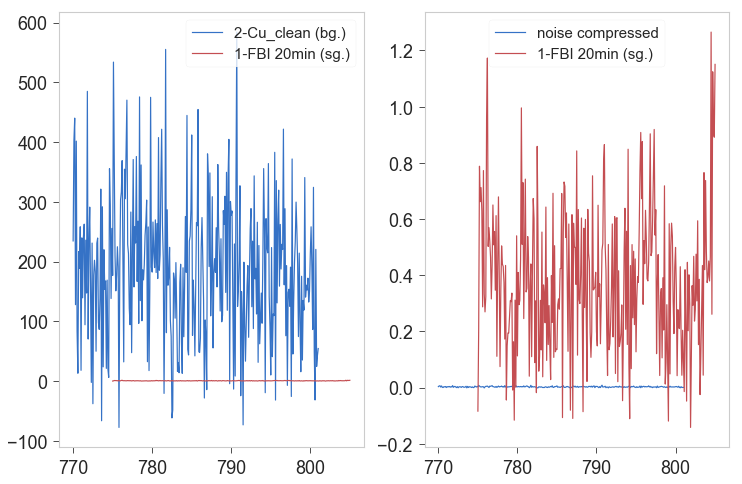

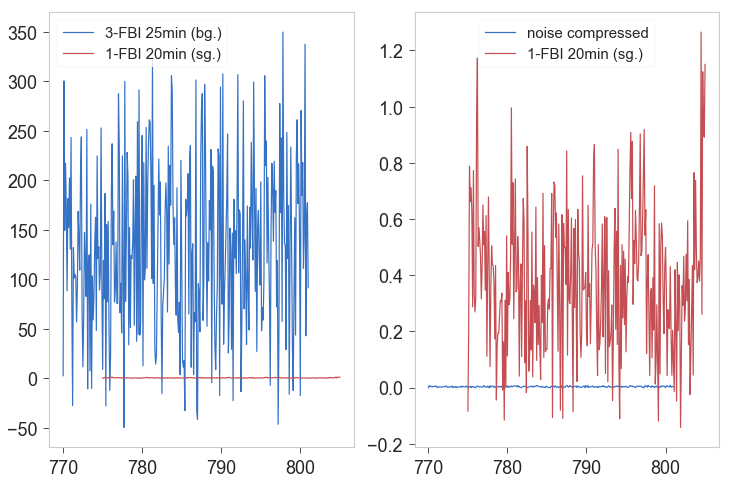

...

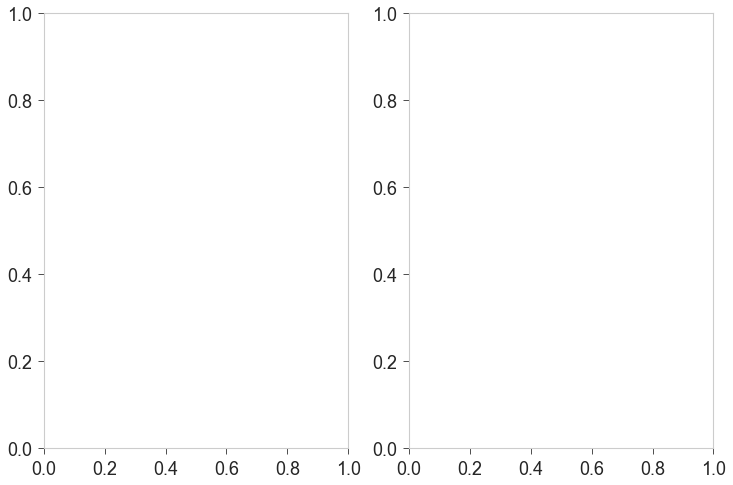

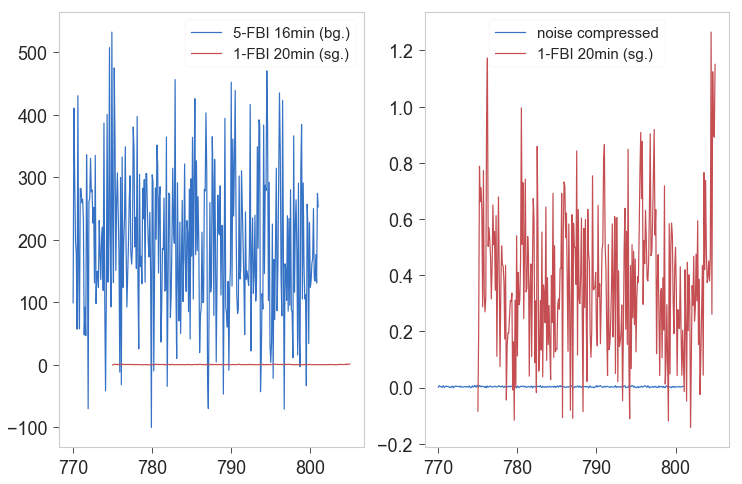

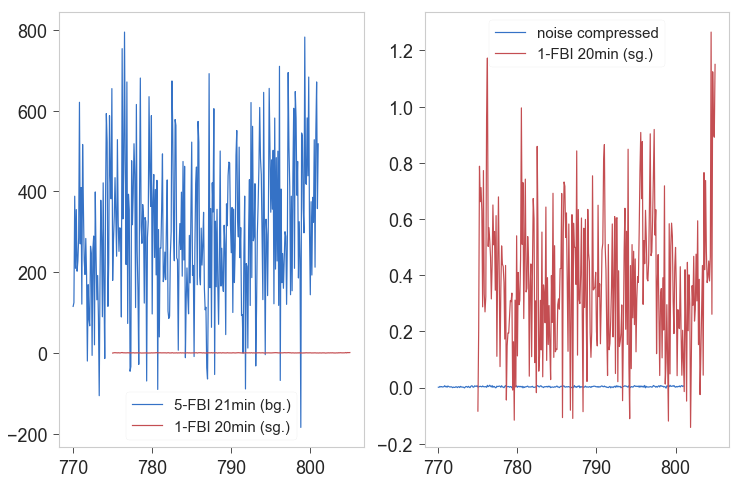

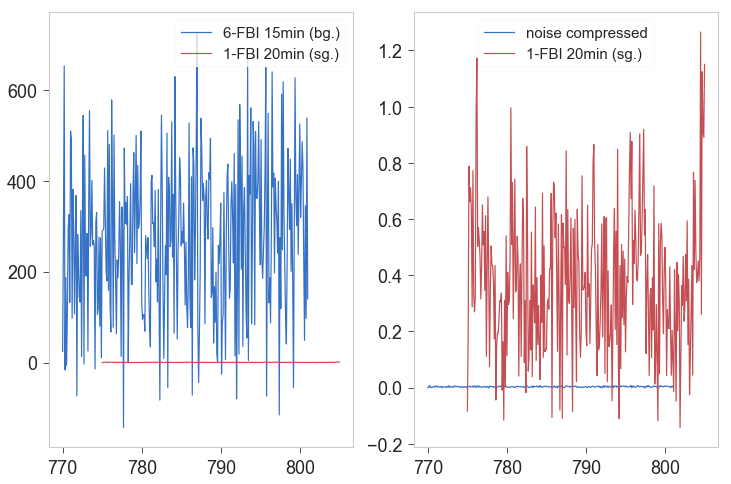

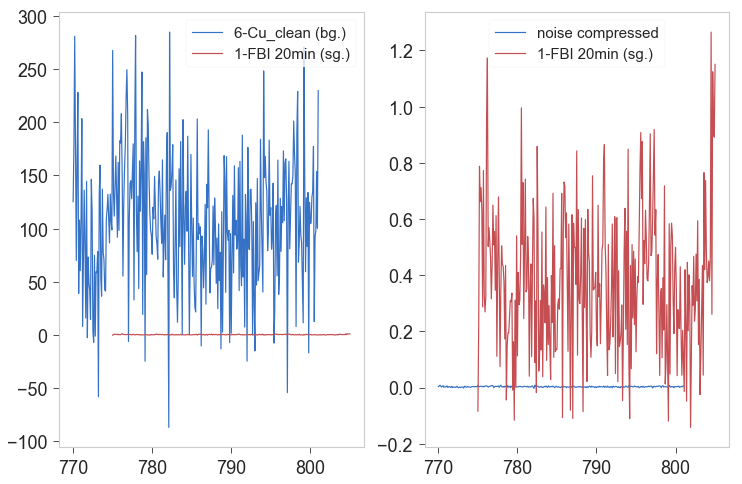

In [21]:
region= 'Ba_3d'
for xp in bg_exps:
    try:
        compress_noisy_region(xp, bg_exps[1], region, inplace=True);
    except KeyError:
        pass

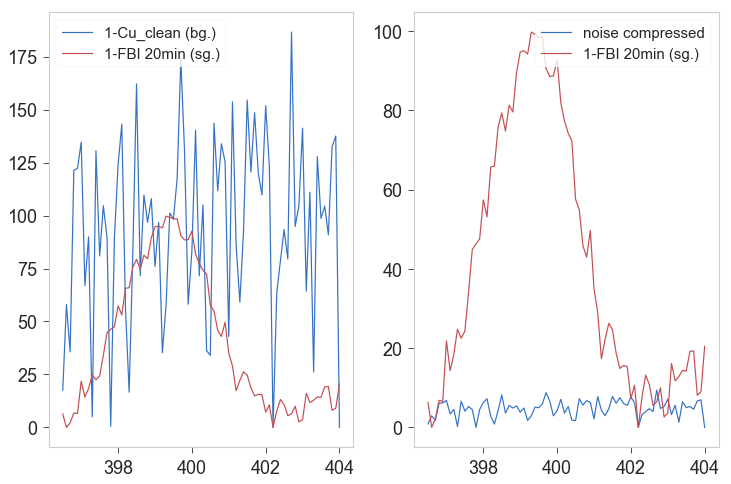

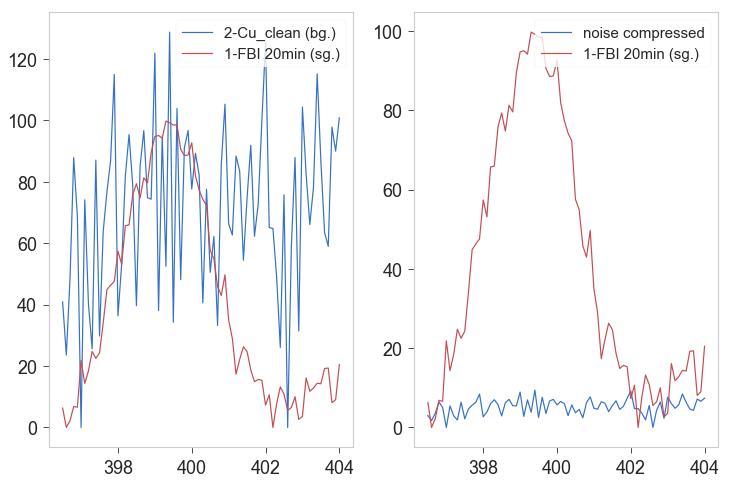

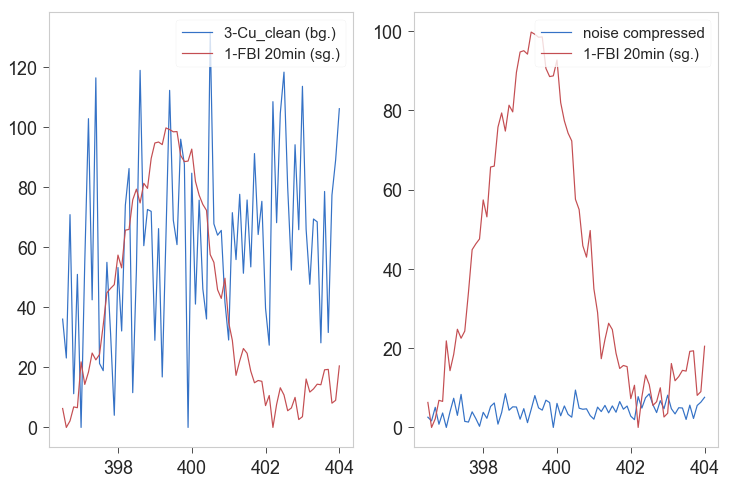

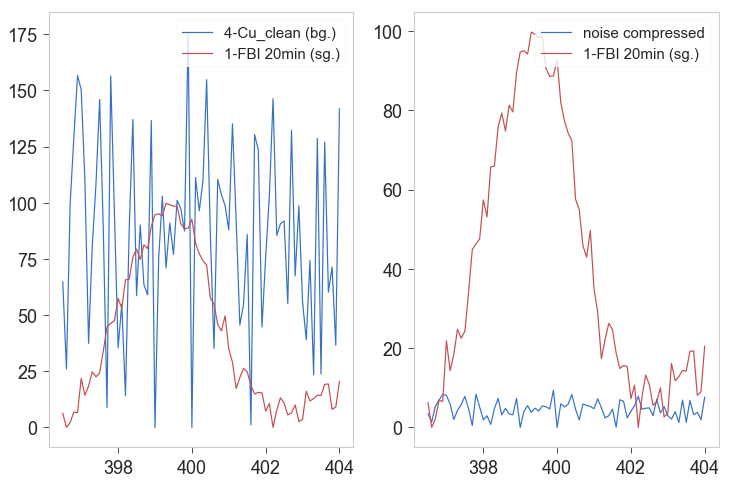

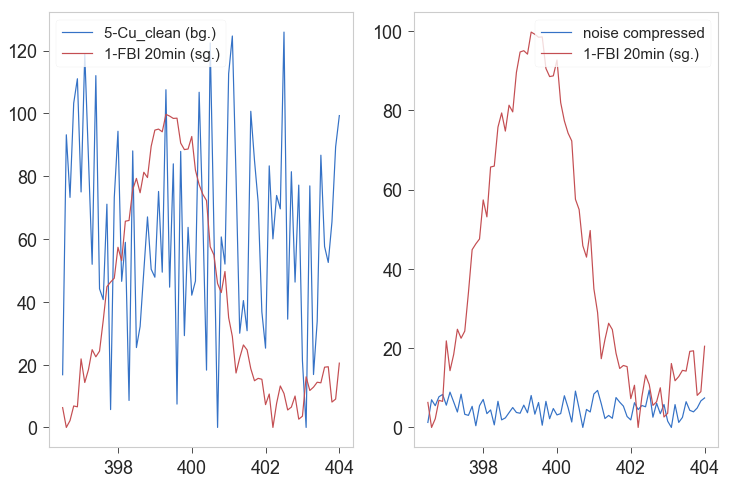

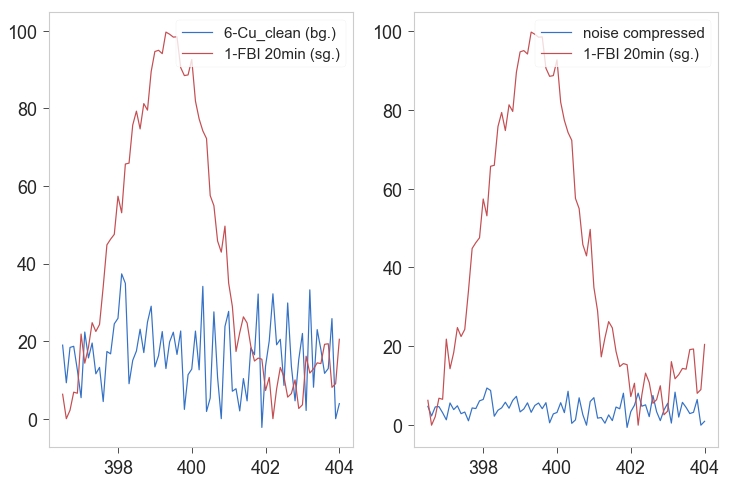

In [22]:
region= 'N_1s'
for xp in bg_exps:
    if 'clean' in xp.name:
        compress_noisy_region(xp, bg_exps[1], region, inplace=True);

# Scale to Cu 2p

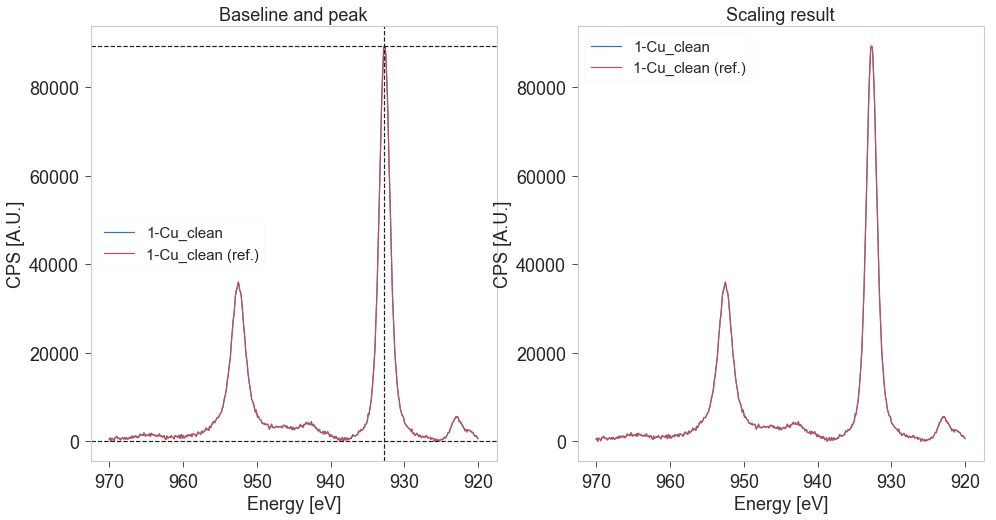

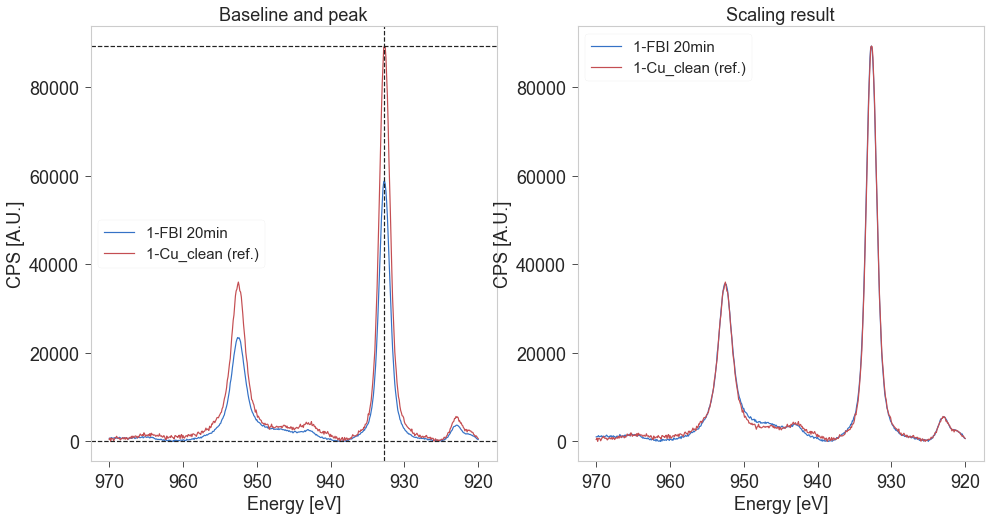

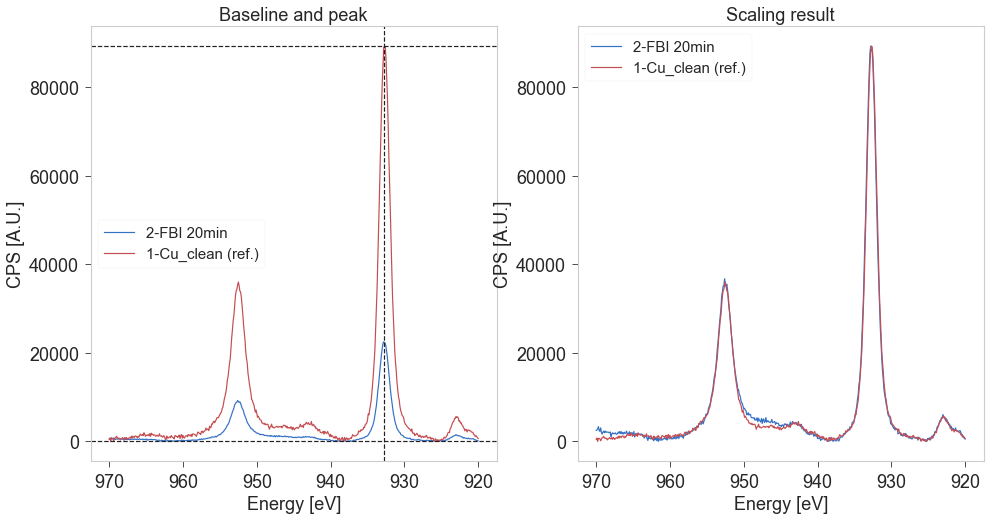

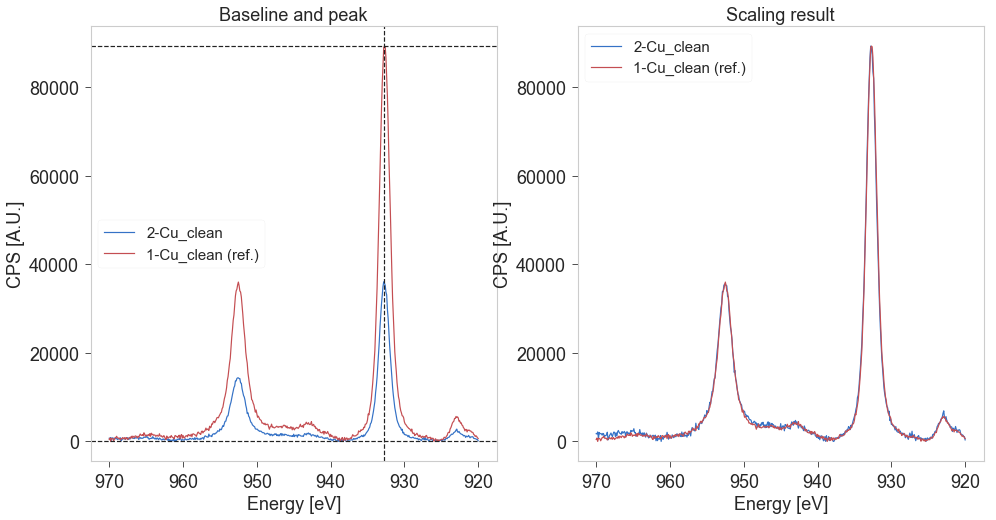

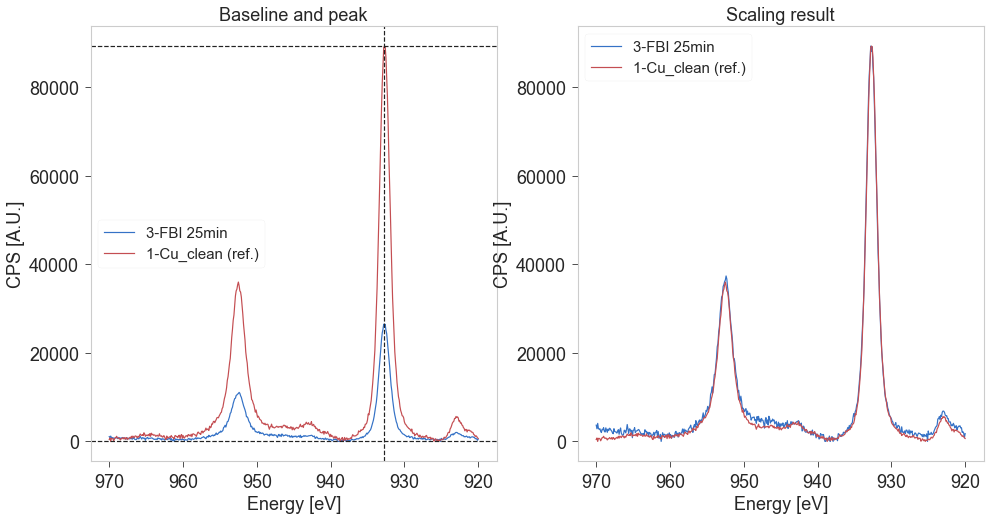

...

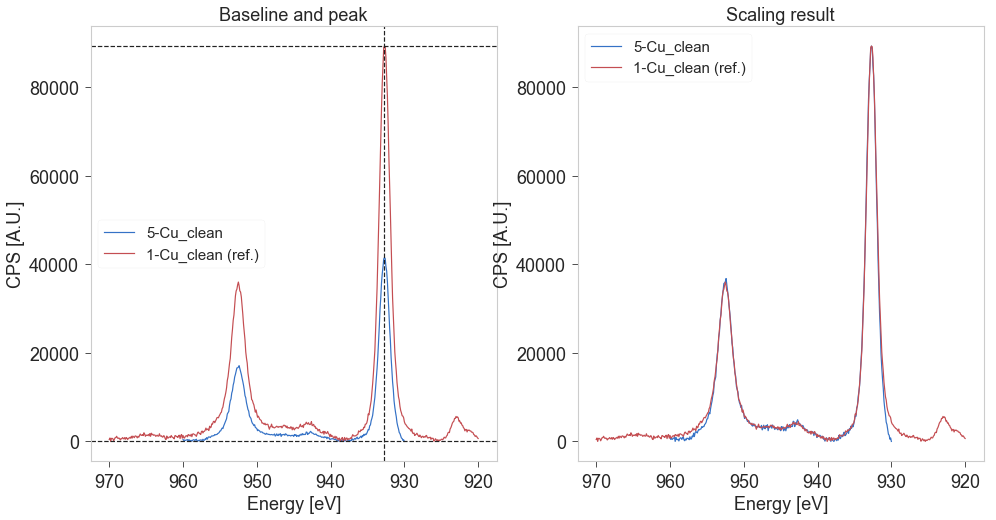

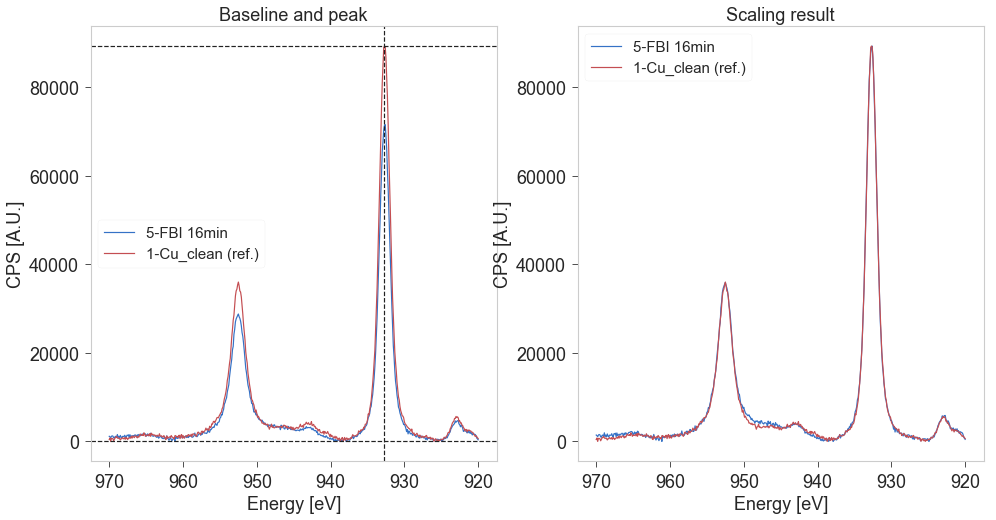

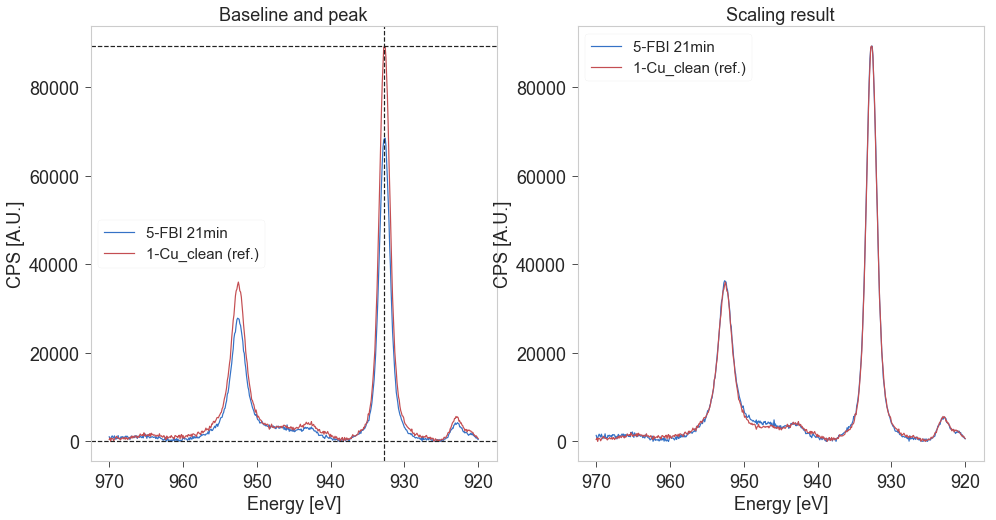

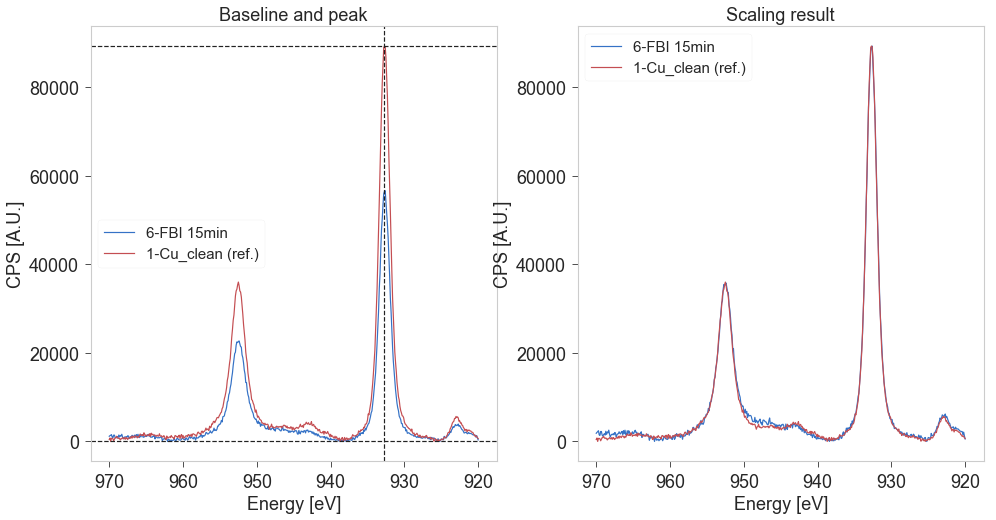

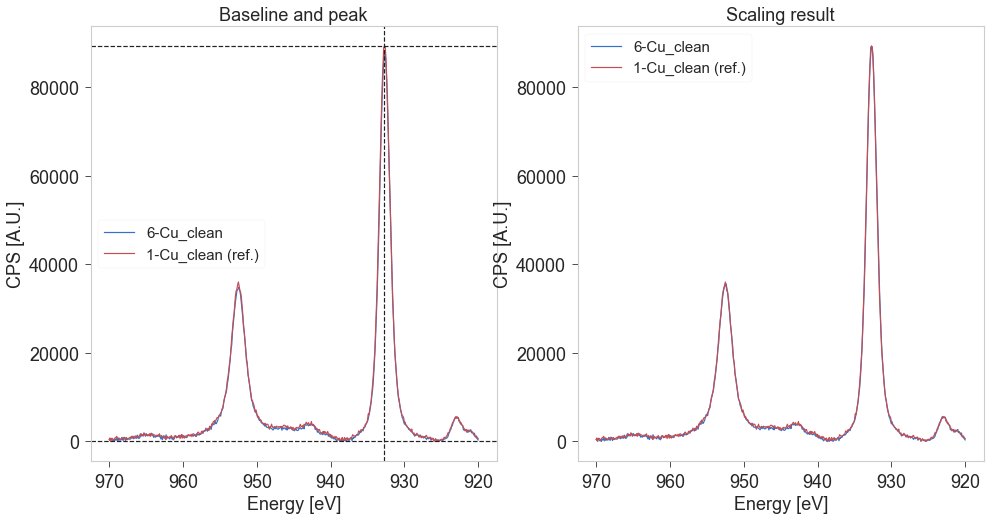

In [274]:
scaled_exps = []
for xpbg in bg_exps:
    scale = scale_and_plot_spectra(xp = xpbg, xpRef = bg_exps[0], region = 'Cu_2p')
    scaled_exps.append(scale_dfx(xp = xpbg, scale_factor = scale))

## Plot scaling results

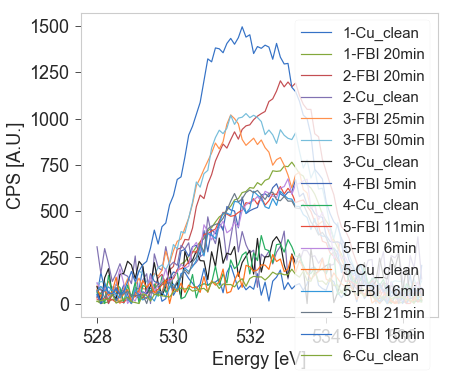

In [275]:
for xp in scaled_exps:
    plot_region(xp, 'O_1s')
# cosmetics_plot()

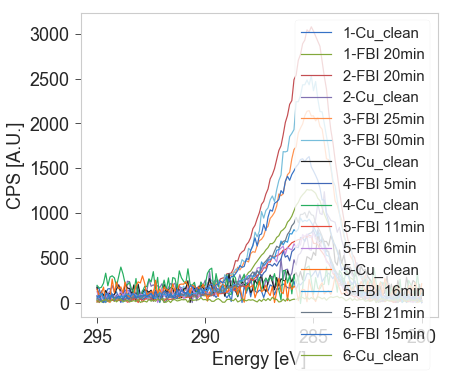

In [276]:
for xp in scaled_exps:
    plot_region(xp, 'C_1s')
cosmetics_plot()

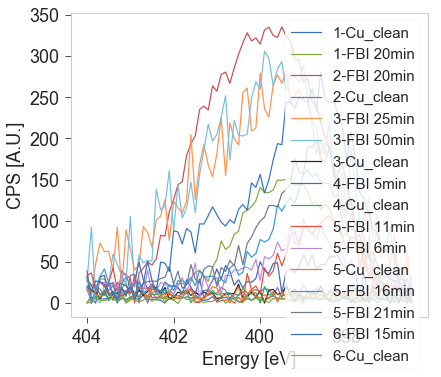

In [277]:
for xp in scaled_exps:
    plot_region(xp, 'N_1s')
cosmetics_plot()

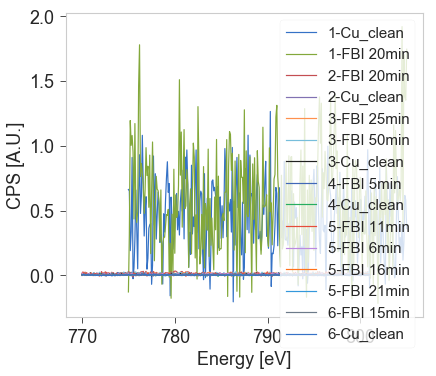

In [278]:
for xp in scaled_exps:
    try:
        plot_region(xp, 'Ba_3d')
    except KeyError: pass
cosmetics_plot()

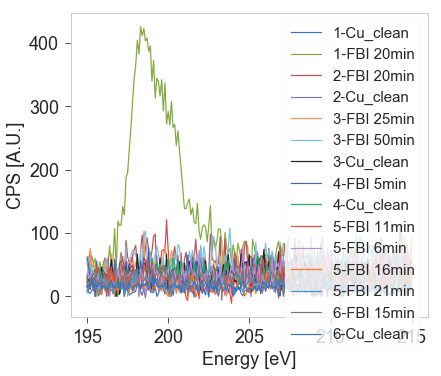

In [279]:
for xp in scaled_exps:
    try:
        plot_region(xp, 'Cl_2p')
    except KeyError: pass
cosmetics_plot()

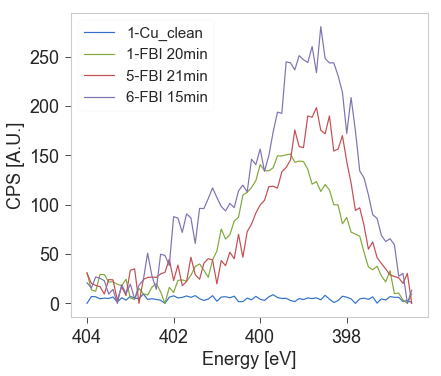

In [280]:
for xp in [0,1,13,14]:
    plot_region(scaled_exps[xp], 'N_1s')
cosmetics_plot()

# Store processed experiments

In [30]:
filepath, filename = os.path.split(experiments[0].path)
filename = os.path.splitext(filename)[0]
filename + '.uxy'

'20200922_1-Cu_clean.uxy'

## Unscaled exps

In [32]:
for xp, xpProc in zip(experiments, bg_exps):
    filepath, filename = os.path.split(xp.path)
    filename = os.path.splitext(filename)[0]
    newpath = filepath
    try:
        os.mkdir(newpath)
    except FileExistsError: pass
#     print(newpath + filename)
    write_processed_xp(newpath + filename + '.uxy', xpProc)

## Scaled exps

In [ ]:
for xp, xpProc in zip(experiments, scaled_exps):
    filepath, filename = os.path.split(xp.path)
    newpath = filepath + '/proc/'
    try:
        os.mkdir(newpath)
    except FileExistsError: pass
#     print(newpath + filename)
    write_processed_xp(newpath + filename, xpProc)

# Layer thickness from Cu attenuation

$$ I_f = I_0 \exp{\left(-\frac{d_A \cos\theta}{\lambda_A} \right)}, $$

where $I_f$ and $I_0$ are the covered and clean intensities of the copper, $d_A$ is the coverage (thickness of layer A), $\theta$ is the takeoff angle and $\lambda_A$ is the mean free path of the material.

$\lambda_{Cu}$ = 39.9 nm

$\lambda_{FBI}$ = 3.85 nm

$\cos\theta = \cos$(10º) = 0.9848

## Reimport processed unscaled data 

In [5]:
path = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/**/*.uxy'
files = glob.glob(path, recursive=True)
files.sort()
files_new = []
for f in files:
    if (' ' not in f) and ('BaCl2' not in f):
        files_new.append(f)

files = files_new
files[9], files[11] = files[11], files[9]
files[4], files[6] = files[6], files[4]

for f in files:
    print(os.path.split(f)[1])

2020_09_22_Cu20200922_1-Cu_clean.uxy
2020_09_22_Cu20200923_1-Cu_FBI_subl_20min.uxy
2020_10_08_Cu20201013_2-Cu_FBI_subl_20min.uxy
2020_10_08_Cu20201013_2-Cu_clean.uxy
2020_10_14_Cu20201014_3-Cu_clean.uxy
2020_10_14_Cu20201014_3-Cu_FBI_subl_50min.uxy
2020_10_14_Cu20201014_3-Cu_FBI_subl_25min.uxy
2020_10_16_Cu20201016_4-Cu_FBI_subl_5min.uxy
2020_10_16_Cu20201016_4-Cu_clean.uxy
2020_10_19_Cu20201019_5-Cu_clean.uxy
2020_10_19_Cu20201019_5-Cu_FBI_subl_6min.uxy
2020_10_19_Cu20201019_5-Cu_FBI_subl_11min.uxy
2020_10_19_Cu20201020_5-Cu_FBI_subl_16min.uxy
2020_10_19_Cu20201020_5-Cu_FBI_subl_21min.uxy
2020_10_21_Cu20201021_6-Cu_FBI_subl_15min.uxy
2020_10_21_Cu20201021_6-Cu_clean.uxy
20201019_5-Cu_FBI_subl_06min.uxy
20201019_5-Cu_FBI_subl_11min.uxy
20210119_7-Cu_FBI_subl_05min.uxy
20210119_7-Cu_FBI_subl_10min.uxy
20210119_7-Cu_FBI_subl_15min.uxy
20210119_7-Cu_FBI_subl_20min.uxy
20210119_7-Cu_clean.uxy


In [6]:
unscaled_exps = [read_processed_xp(path=f) for f in files]

for xp in unscaled_exps:
    if 'FBI' in xp.name:
        xp.name = xp.name.replace('Cu_', '').replace('_subl_', ' ')
    print(xp.name, '\t', xp.date)

1-Cu_clean 	 2020.09.22
1-FBI 20min 	 2020.09.23
2-FBI 20min 	 2020.10.13
2-Cu_clean 	 2020.10.13
3-Cu_clean 	 2020.10.14
3-FBI 50min 	 2020.10.14
3-FBI 25min 	 2020.10.14
4-FBI 5min 	 2020.10.16
4-Cu_clean 	 2020.10.16
5-Cu_clean 	 2020.10.19
5-FBI 6min 	 2020.10.19
5-FBI 11min 	 2020.10.19
5-FBI 16min 	 2020.10.20
5-FBI 21min 	 2020.10.20
6-FBI 15min 	 2020.10.21
6-Cu_clean 	 2020.10.21
5-FBI 6min 	 2020.10.19
5-FBI 11min 	 2020.10.19
7-FBI 5min 	 20.21.0119
7-FBI 10min 	 20.21.0119
7_Cu-FBI 15min 	 20.21.0119
7-FBI 20min 	 20.21.0119
7-Cu_clean 	 20.21.0119


In [25]:
region = 'Cu_2p'
for xp in unscaled_exps:
    crop_spectrum(xp, region, eup=960, edw=930, inplace=True)

## ML saturation

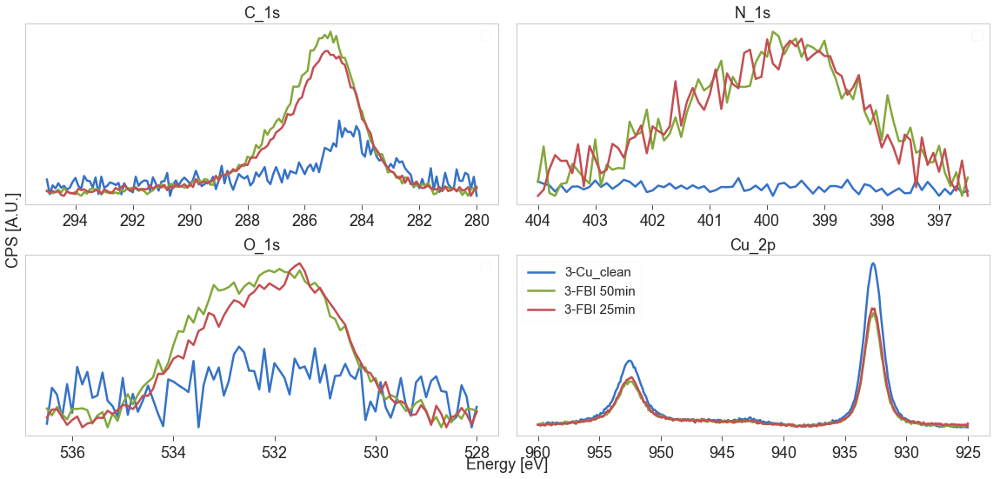

In [25]:
regions = ['C_1s', 'N_1s', 'O_1s', 'Cu_2p']

ax = plot_xp_regions(unscaled_exps[4:7], regions, ncols=2)
plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublimation/original_progrowth.png', dpi=200)

## Successive growth

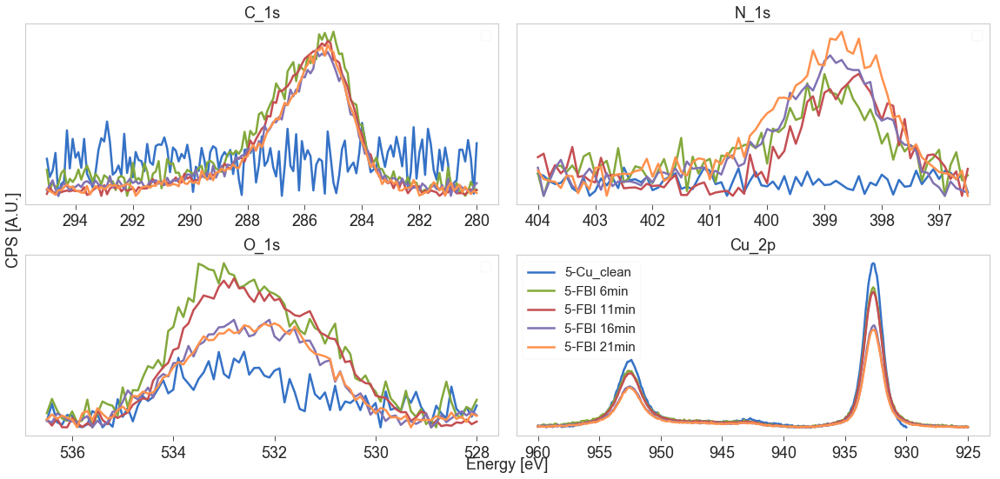

In [24]:
ax = plot_xp_regions(unscaled_exps[9:14], regions, ncols=2)
plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublimation/original_progrowth.png', dpi=200)

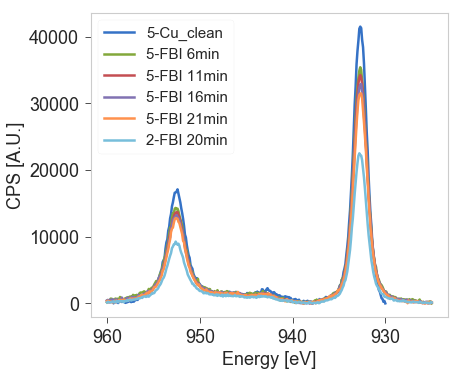

In [14]:
l = list(range(9,14))
l.append(2)

for i in l:
    plot_region(unscaled_exps[i], 'Cu_2p')
cosmetics_plot()

##### "Cheating": scale experiments of 20 mins evaporation (5-FBI 21 min, 5-FBI-16 min, after voltage scan recalibration) to the level of 2-FBI 20 min (before recalibration)
See plot of voltage scan: at the set voltage (2300 V) the experiments recorded previous to the calibraton (5-FBI 5, 11 min, 5-clean_Cu, corresponding to the pink curve) had a baseline intensity of 3.5e3 cps, while for the experiments after the calibration (5-FBI 16, 21 min, corresponding to the blue curve) the experiments had 9.5e3 cps as baseline

The factor is 3.5/9.5 = 0.36

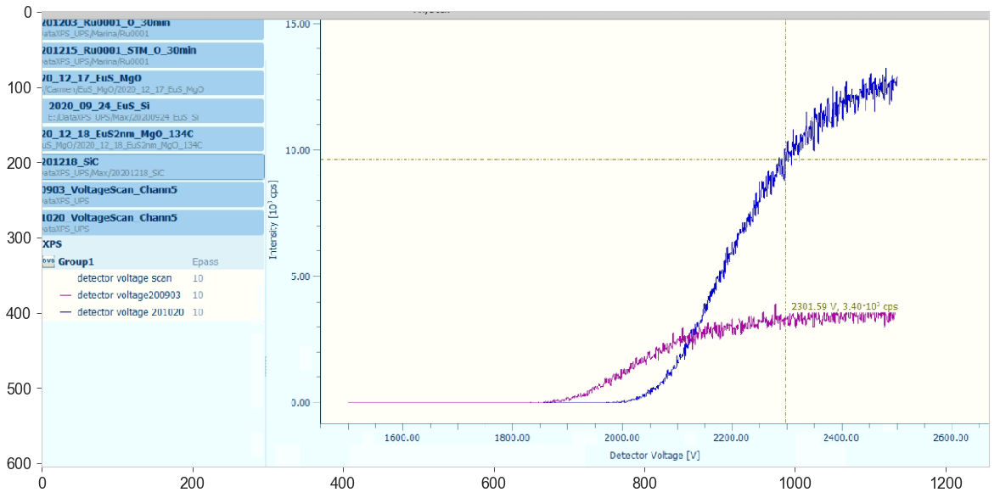

In [129]:
fig = plt.figure(figsize=(20, 15))
voltScan = plt.imread('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublimation/voltageScan.png')
plt.imshow(voltScan)

In [67]:
unscaled_exps[12].name

'5-FBI 16min'

[(0, 6000.0), (500, 0), Text(0.5, 1.0, 'Overviews')]

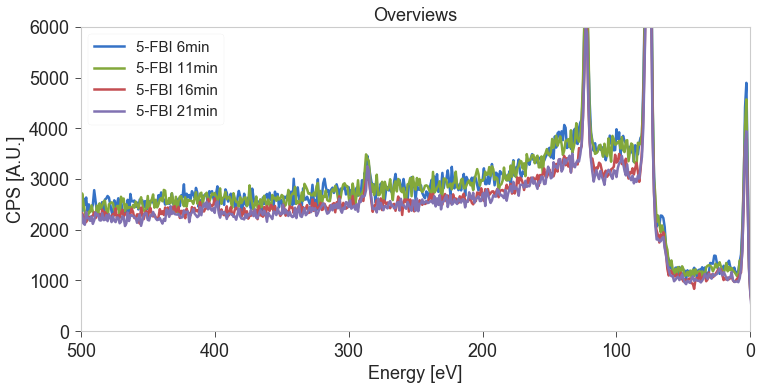

In [8]:
selection = list(range(12, 14))
plot_region(unscaled_exps[10], 'overview_')
plot_region(unscaled_exps[11], 'overview_')

for i in selection:
#     scale = scale_and_plot_spectra(xp = unscaled_exps[i], xpRef = unscaled_exps[2], region = 'Cu_2p')
    xpsc = scale_dfx(xp = unscaled_exps[i], scale_factor = 0.46, inplace=True)
#     plot_region(unscaled_exps[i], 'overview_')
    plot_region(xpsc, 'overview_')


cosmetics_plot()
plt.gcf().set_figwidth(12)
plt.gca().set(xlim=(500, 0), ylim=(0,6e3), title='Overviews')

[(1150, 650)]

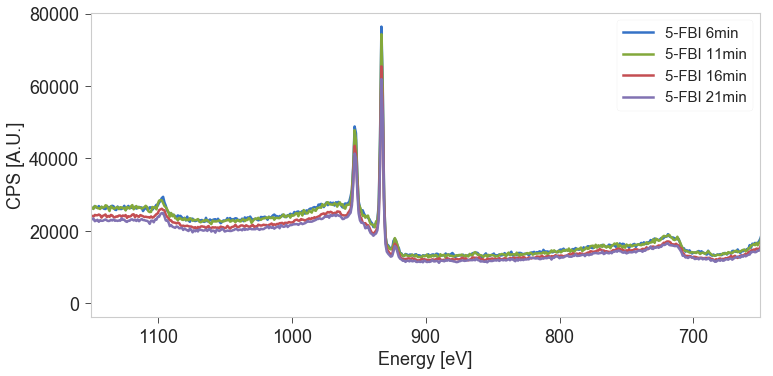

In [131]:
for i in l[1:-1]:
    plot_region(unscaled_exps[i], 'overview_')
cosmetics_plot()
plt.gcf().set_figwidth(12)
plt.gca().set(xlim=(1150, 650))#, ylim=(0,3e4))

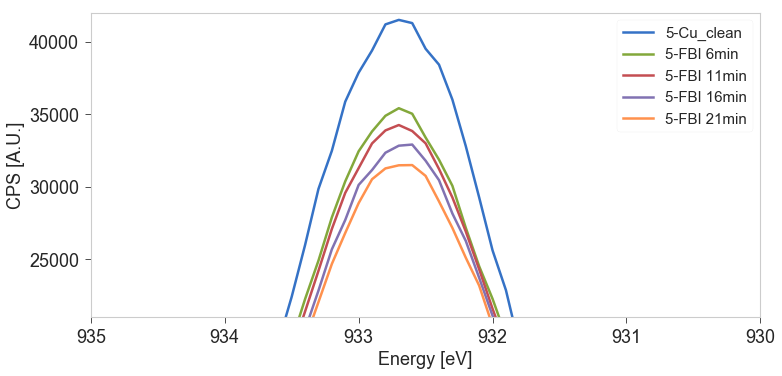

In [124]:
for i in l[:-1]:
    plot_region(unscaled_exps[i], 'Cu_2p')
plt.gca().set(ylim=(2.1e4, 4.2e4), xlim=(935,930))
plt.gcf().set_figwidth(12)

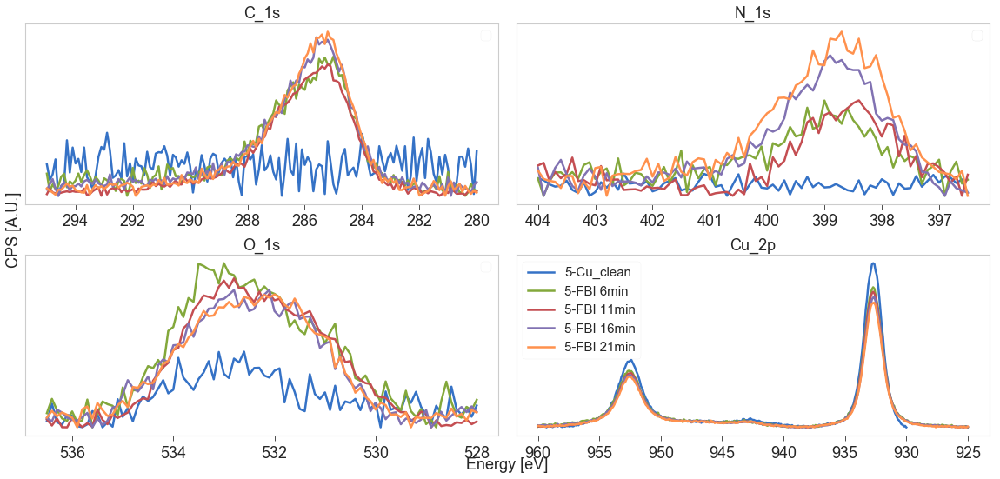

In [84]:
ax = plot_xp_regions(unscaled_exps[9:14], regions, ncols=2)
plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/papers/fbi_cu_sublimation/progressive_growth.png', dpi=200)

In [113]:
scale

0.32872753340304456

## Cu attenuation

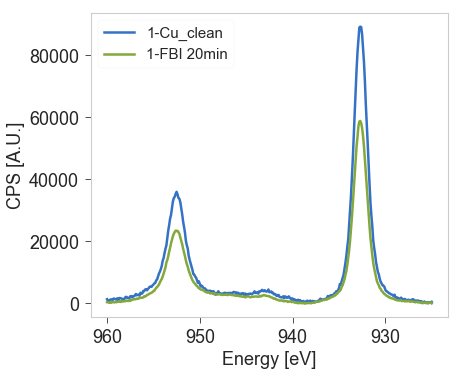

In [14]:
plot_region(unscaled_exps[0], region)
plot_region(unscaled_exps[1], region)
cosmetics_plot()

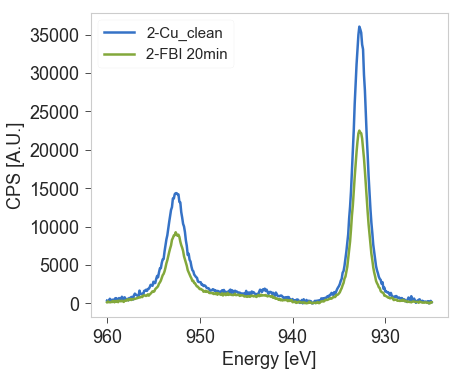

In [15]:
plot_region(unscaled_exps[3], region)
plot_region(unscaled_exps[2], region)
cosmetics_plot()

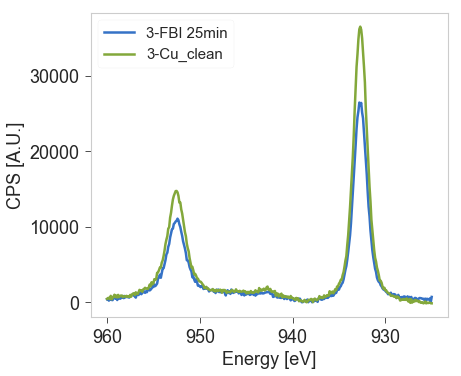

In [16]:
plot_region(unscaled_exps[6], region)
plot_region(unscaled_exps[4], region)
cosmetics_plot()

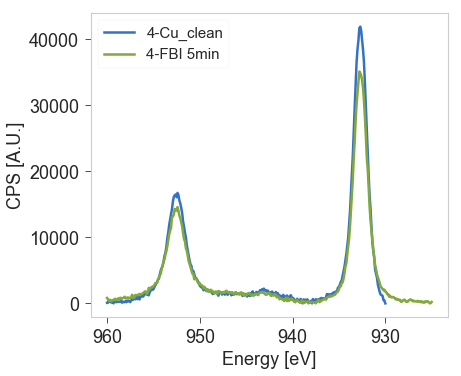

In [17]:
plot_region(unscaled_exps[8], region)
plot_region(unscaled_exps[7], region)
cosmetics_plot()

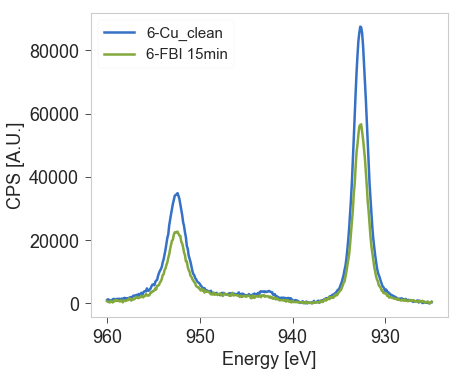

In [18]:
plot_region(unscaled_exps[15], region)
plot_region(unscaled_exps[14], region)
cosmetics_plot()

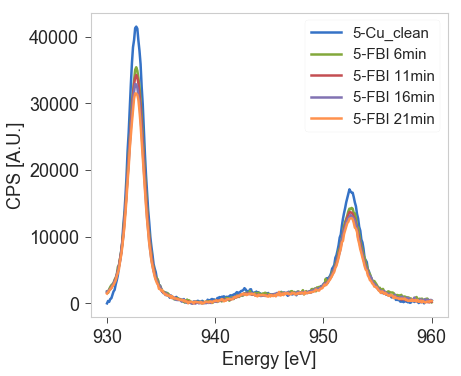

In [26]:
plot_region(unscaled_exps[9], region)
plot_region(unscaled_exps[10], region)
plot_region(unscaled_exps[11], region)
plot_region(unscaled_exps[12], region)
plot_region(unscaled_exps[13], region)

cosmetics_plot()

In [18]:
xpf = unscaled_exps[2]
xp0 = unscaled_exps[3]
If = np.trapz(xpf.dfx[region].dropna().counts, dx=0.1)
I0 = np.trapz(xp0.dfx[region].dropna().counts, dx=0.1)
from invisible_cities.core.system_of_units import nm
mfp = 3.75 * nm
costh = np.cos(10*np.pi/180)

thick = mfp/costh*np.log(I0/If)
thick / nm
# np.log(I0/If+1)

1.737820530230788

In [166]:
def layer_thickness(xpf: XPS_experiment, xp0: XPS_experiment, region: str, mfp: float, takeoff: float):
    """Estimate layer thickness from the attenuation in substrate (region) between an experiment
    with the layer xpf and a reference (clean) experiment xp0.
    Parameters:
    ------------
    - xpf: Experiment with substrate CL attenuated by layer.
    - xp0: Clean experiment for reference.
    - region: substrate region.
    - mfp: mean free path of the molecule conforming the layer (use QUASES to compute it).
           NOTE: it must be introduced in nm.
    - takeoff: angle between the surface normal and the analyser entry.
    
    Return:
    -----------
    
    """
    from invisible_cities.core.system_of_units import nm
    If = np.trapz(xpf.dfx[region].dropna().counts, dx=0.1)
    I0 = np.trapz(xp0.dfx[region].dropna().counts, dx=0.1)
    
    dIf = np.sqrt(If)
    dI0 = np.sqrt(I0)
    
    costh = np.cos(takeoff*np.pi/180)

    thick = mfp/costh*np.log(I0/If)
    dthick = mfp/costh*np.sqrt((dI0/I0)**2 + (dIf/If)**2)
    return thick / nm, dthick / nm

In [133]:
from invisible_cities.core.system_of_units import nm
mfp = 3.75 * nm

In [138]:
thick1 = layer_thickness(unscaled_exps[1], unscaled_exps[0], 'Cu_2p', mfp, takeoff = 10)
thick1[0]/nm, thick1[1]/nm

(1.5854797993303344, 0.010465954015531645)

In [139]:
thick2 = layer_thickness(unscaled_exps[2], unscaled_exps[3], 'Cu_2p', mfp, takeoff = 10)
thick2[0]/nm, thick2[1]/nm

(1.737820530230788, 0.016609978645137743)

In [140]:
thick3= layer_thickness(unscaled_exps[6], unscaled_exps[4], 'Cu_2p', mfp, takeoff = 10)
thick3[0]/nm, thick3[1]/nm

(1.0066132757413961, 0.01559074477004313)

In [141]:
thick4 = layer_thickness(unscaled_exps[7], unscaled_exps[8], 'Cu_2p', mfp, takeoff = 10)
thick4[0]/nm, thick4[1]/nm

(0.33582456541848793, 0.014330534947629894)

In [142]:
thick5 = layer_thickness(unscaled_exps[13], unscaled_exps[9], 'Cu_2p', mfp, takeoff = 10)
# unscaled_exps[9].name, unscaled_exps[13].name
thick5[0]/nm, thick5[1]/nm

(0.7544344314202798, 0.014911779440792364)

In [19]:
thick5 = layer_thickness(unscaled_exps[13], unscaled_exps[9], 'Cu_2p', mfp, takeoff = 10)
# unscaled_exps[9].name, unscaled_exps[13].name
thick5[0]/nm, thick5[1]/nm

(0.7544344314202798, 0.014911779440792364)

In [27]:
# thick5 = layer_thickness(unscaled_exps[13], unscaled_exps[9], 'Cu_2p', mfp, takeoff = 10)
for xp in unscaled_exps[10:14]:
    thick = layer_thickness(xpf=xp, xp0=unscaled_exps[9], region='Cu_2p', mfp=3.85*nm, takeoff = 10)
    print('%.3f ± %.3f' %(thick[0]/nm, thick[1]/nm))

thick5[0]/nm, thick5[1]/nm

0.379 ± 0.015
0.589 ± 0.015
0.658 ± 0.015
0.841 ± 0.015


(0.7544344314202798, 0.014911779440792364)

In [143]:
thick6 = layer_thickness(unscaled_exps[14], unscaled_exps[15], 'Cu_2p', mfp, takeoff = 10)
thick6[0]/nm, thick6[1]/nm

(1.5093403046212912, 0.010611127633352565)

In [22]:
def fbi_n_density(thick_ml: tuple):
    """Compute the atomic density for an FBI (molecule radius hardcoded) cylindric layer 
    of height thick_ml (must include central value and error)"""
    
    r_fbi = 0.683 * nm   # from Fernando's calculation, globularity 1
    V_fbi = r_fbi**3 * 4/3* np.pi
    
    a_fov = np.pi*1**2          # Assume an homogeneous layer of radius 1 mm2
    V_fov = a_fov * thick_ml[0] * nm
    dV_fov = a_fov * thick_ml[1] * nm
    
    N_molecs = V_fov / V_fbi # Molecs per mm3
    dN_molecs = dV_fov / V_fbi
    return N_molecs, dN_molecs

In [209]:
from invisible_cities.core.system_of_units import mm
r = 1 * mm

print('%.2e ± %.2e molecules in 1 mm2 area' %n_ml(thick1) )

3.83e+12 ± 2.53e+10 molecules in 1 mm2 area


In [210]:
print('%.2e ± %.2e molecules in 1 mm2 area' %n_ml(thick2) )

4.20e+12 ± 4.01e+10 molecules in 1 mm2 area


In [211]:
print('%.2e ± %.2e molecules in 1 mm2 area' %n_ml(thick3) )

2.43e+12 ± 3.77e+10 molecules in 1 mm2 area


In [212]:
print('%.2e ± %.2e molecules in 1 mm2 area' %n_ml(thick4) )

8.12e+11 ± 3.46e+10 molecules in 1 mm2 area


In [213]:
print('%.2e ± %.2e molecules in 1 mm2 area' %n_ml(thick5))

4.08e+12 ± 3.87e+10 molecules in 1 mm2 area


In [214]:
print('%.2e ± %.2e molecules in 1 mm2 area' %n_ml(thick6) )

3.65e+12 ± 2.56e+10 molecules in 1 mm2 area
